### Make Predictions on new images

In [1]:
from keras.models import model_from_json
import cv2
import dlib
from skimage.transform import resize
import numpy as np
from matplotlib import image
import matplotlib.pyplot as plt
import pandas as pd

In [2]:
### HERE comes the image collection code

In [3]:
## Test on Valid dataset

In [5]:
dataset=pd.read_csv('../train_full_df.csv')
dataset.head()

,Unnamed: 0,ID,path,id,name,height,weight,bmi
0,0,akshay,images/akshay1.jpeg,1,akshay kumar,1.78,80,25.249337
1,1,akshay,images/akshay10.jpg,1,akshay kumar,1.78,80,25.249337
2,2,akshay,images/akshay11.jpg,1,akshay kumar,1.78,80,25.249337
3,3,akshay,images/akshay12.jpg,1,akshay kumar,1.78,80,25.249337
4,4,akshay,images/akshay13.jpg,1,akshay kumar,1.78,80,25.249337


In [6]:
all_paths_val=dataset['path'].tolist()
all_bmi_val=dataset['bmi']


In [10]:
all_paths_val

['images/akshay1.jpeg',
 'images/akshay10.jpg',
 'images/akshay11.jpg',
 'images/akshay12.jpg',
 'images/akshay13.jpg',
 'images/akshay14.jpg',
 'images/akshay15.jpg',
 'images/akshay16.jpg',
 'images/akshay17.jpg',
 'images/akshay18.jpg',
 'images/akshay19.jpg',
 'images/akshay2.jpeg',
 'images/akshay20.jpg',
 'images/akshay3.jpg',
 'images/akshay4.jpg',
 'images/akshay5.jpg',
 'images/akshay6.jpg',
 'images/akshay7.jpg',
 'images/akshay8.jpg',
 'images/akshay9.jpg',
 'images/amir1.jpg',
 'images/amir10.jpg',
 'images/amir11.jpg',
 'images/amir12.jpg',
 'images/amir13.jpg',
 'images/amir14.jpeg',
 'images/amir2.jpg',
 'images/amir3.jpg',
 'images/amir4.jpeg',
 'images/amir5.jpg',
 'images/amir7.jpeg',
 'images/amir8.jpg',
 'images/amir9.jpg',
 'images/anupam2.jpg',
 'images/anupam3.jpg',
 'images/anupam4.jpg',
 'images/anupam5.jpg',
 'images/anupam6.jpg',
 'images/anupam7.jpeg',
 'images/anupam8.jpg',
 'images/anurag1.jpg',
 'images/anurag2.jpg',
 'images/anurag3.jpg',
 'images/anurag

In [11]:
def preprocess_image(img=None,data=None,image_path=None):
    if image_path:
        image_path=str(path)
        img = cv2.imread(image_path)
        data= image.imread(image_path)
    
    gray = cv2.cvtColor(src=img, code=cv2.COLOR_BGR2GRAY)
    detector = dlib.get_frontal_face_detector()
    faces = detector(gray)
    if len(faces)>0:
        x1 = faces[0].left() # left point
        y1 = faces[0].top() # top point
        x2 = faces[0].right() # right point
        y2 = faces[0].bottom()
        face_out=cv2.rectangle(img=img, pt1=(x1, y1), pt2=(x2, y2), color=(0, 255, 0))

        ## Add some margin on the faces
        margin20_x=int(((x2-x1)*0.2)//2)
        margin20_y=int(((y2-y1)*0.2)//2)

        margin10_x=int(((x2-x1)*0.1)//2)
        margin10_y=int(((y2-y1)*0.1)//2)

        output= data[y1-margin20_y:y2+margin20_y,x1-margin20_x:x2+margin20_x,:]

        #resized_data = resize(output, (300, 300, 3))

        resized_data = cv2.resize(output, (300, 300), interpolation = cv2.INTER_AREA)
    else:
        resized_data=None
        
    return resized_data

In [12]:
# model_without_tl_without_aug
# model_without_tl_with_aug
# model_with_tl_without_aug
# model_with_tl_with_aug

model_name1='model_without_tl_without_aug'
json_file = open(model_name1+'.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
loaded_model1 = model_from_json(loaded_model_json)
# load weights into new model
loaded_model1.load_weights(model_name1+".h5")



model_name2='model_without_tl_with_aug'
json_file = open(model_name2+'.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
loaded_model2 = model_from_json(loaded_model_json)
# load weights into new model
loaded_model2.load_weights(model_name2+".h5")



model_name3='model_with_tl_without_aug'
json_file = open(model_name3+'.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
loaded_model3 = model_from_json(loaded_model_json)
# load weights into new model
loaded_model3.load_weights(model_name3+".h5")


model_name4='model_with_tl_with_aug'
json_file = open(model_name4+'.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
loaded_model4 = model_from_json(loaded_model_json)
# load weights into new model
loaded_model4.load_weights(model_name4+".h5")

print("Loaded models from disk")


Loaded models from disk


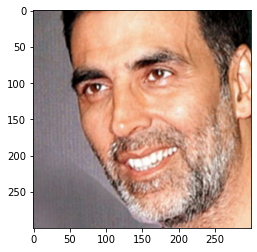

True BMI 25.2493372
Predicted BMI 3:  22.46898
Difference:  2.780356410815429
*************************************************************************



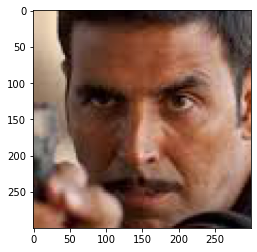

True BMI 25.2493372
Predicted BMI 3:  29.078703
Difference:  3.829365726635743
*************************************************************************



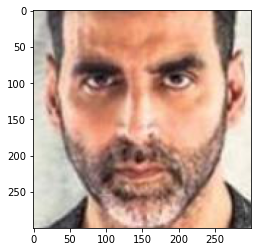

True BMI 25.2493372
Predicted BMI 3:  21.58246
Difference:  3.6668767965576166
*************************************************************************



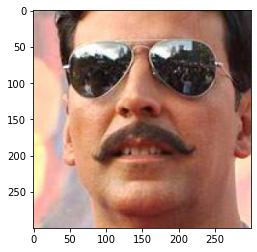

True BMI 25.2493372
Predicted BMI 3:  28.09209
Difference:  2.8427534066894538
*************************************************************************



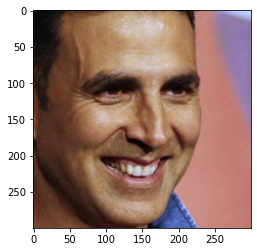

True BMI 25.2493372
Predicted BMI 3:  27.211706
Difference:  1.962368961499024
*************************************************************************



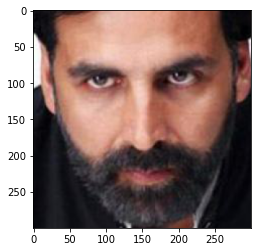

True BMI 25.2493372
Predicted BMI 3:  24.111881
Difference:  1.1374559438964837
*************************************************************************



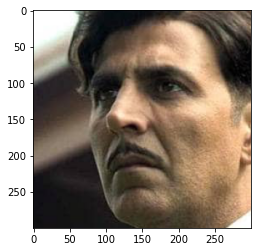

True BMI 25.2493372
Predicted BMI 3:  25.029127
Difference:  0.22021007902831968
*************************************************************************



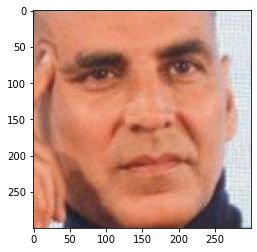

True BMI 25.2493372
Predicted BMI 3:  26.819887
Difference:  1.5705499612548834
*************************************************************************



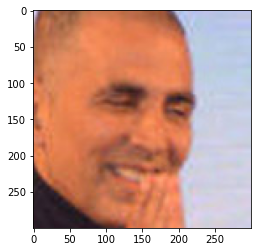

True BMI 25.2493372
Predicted BMI 3:  21.284016
Difference:  3.9653215444824212
*************************************************************************



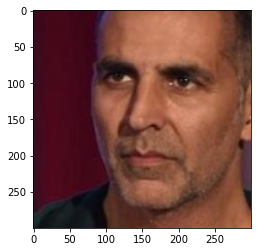

True BMI 25.2493372
Predicted BMI 3:  24.66275
Difference:  0.5865869558593744
*************************************************************************



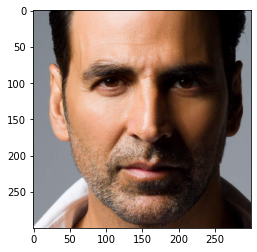

True BMI 25.2493372
Predicted BMI 3:  27.023191
Difference:  1.7738542520263678
*************************************************************************



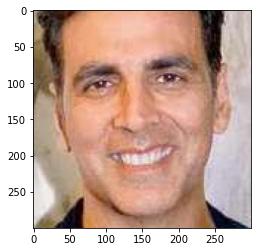

True BMI 25.2493372
Predicted BMI 3:  23.55224
Difference:  1.6970968282958978
*************************************************************************



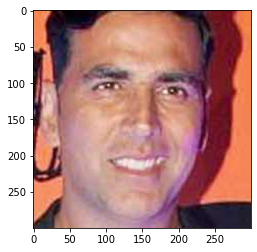

True BMI 25.2493372
Predicted BMI 3:  25.596113
Difference:  0.3467760049560553
*************************************************************************



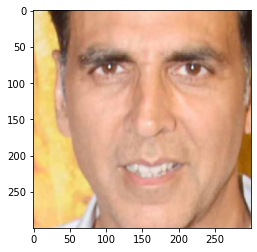

True BMI 25.2493372
Predicted BMI 3:  26.397942
Difference:  1.1486043893554694
*************************************************************************



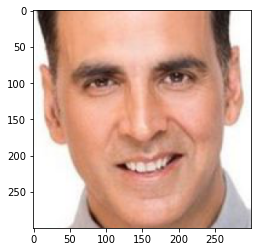

True BMI 25.2493372
Predicted BMI 3:  25.06154
Difference:  0.18779659636230406
*************************************************************************



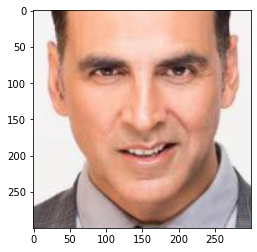

True BMI 25.2493372
Predicted BMI 3:  23.235386
Difference:  2.0139513052246087
*************************************************************************



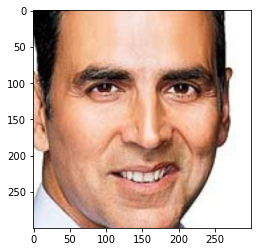

True BMI 25.2493372
Predicted BMI 3:  28.43171
Difference:  3.182372089550782
*************************************************************************



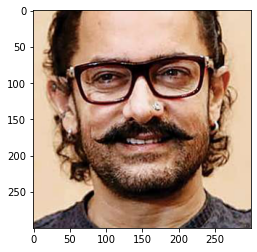

True BMI 26.34649403
Predicted BMI 3:  27.24417
Difference:  0.8976752052294934
*************************************************************************



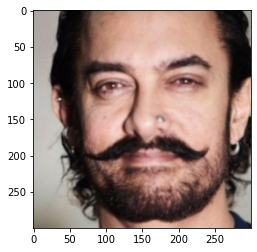

True BMI 26.34649403
Predicted BMI 3:  27.500317
Difference:  1.153822589873048
*************************************************************************



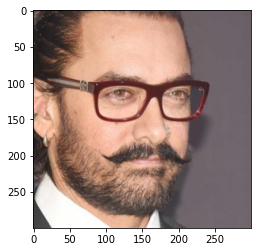

True BMI 26.34649403
Predicted BMI 3:  23.497524
Difference:  2.8489697685253894
*************************************************************************



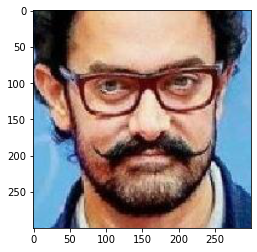

True BMI 26.34649403
Predicted BMI 3:  30.096296
Difference:  3.749802280424806
*************************************************************************



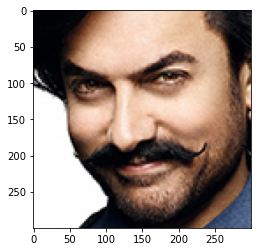

True BMI 26.34649403
Predicted BMI 3:  28.222282
Difference:  1.87578837966797
*************************************************************************



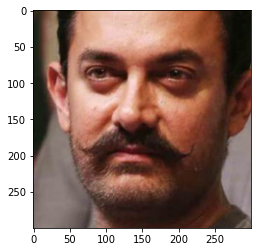

True BMI 26.34649403
Predicted BMI 3:  24.622326
Difference:  1.724168132783202
*************************************************************************



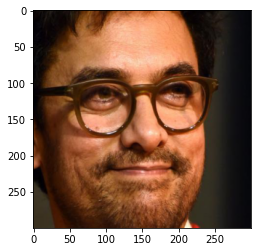

True BMI 26.34649403
Predicted BMI 3:  30.18255
Difference:  3.8360564002978528
*************************************************************************



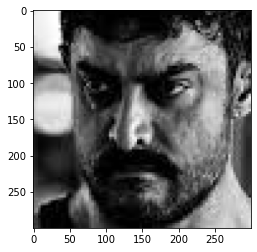

True BMI 26.34649403
Predicted BMI 3:  21.055485
Difference:  5.291009258271483
*************************************************************************



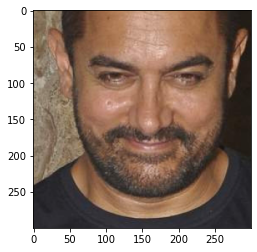

True BMI 26.34649403
Predicted BMI 3:  22.57824
Difference:  3.76825458908203
*************************************************************************



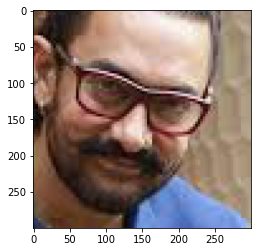

True BMI 26.34649403
Predicted BMI 3:  21.54099
Difference:  4.805503200532225
*************************************************************************



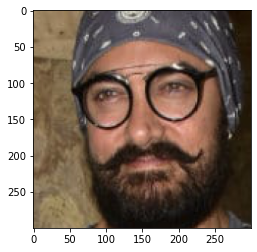

True BMI 26.34649403
Predicted BMI 3:  28.397516
Difference:  2.0510222206103528
*************************************************************************



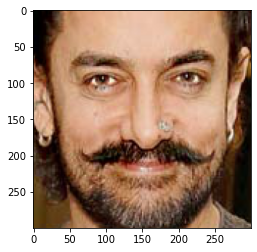

True BMI 26.34649403
Predicted BMI 3:  23.403408
Difference:  2.9430859794628894
*************************************************************************



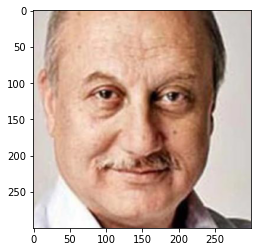

True BMI 24.8015873
Predicted BMI 3:  27.112888
Difference:  2.3113010361816393
*************************************************************************



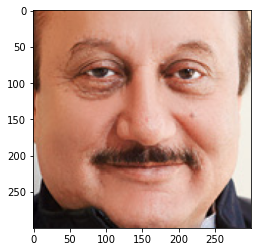

True BMI 24.8015873
Predicted BMI 3:  29.339167
Difference:  4.53757934123535
*************************************************************************



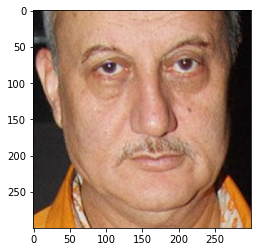

True BMI 24.8015873
Predicted BMI 3:  31.471996
Difference:  6.6704090073730455
*************************************************************************



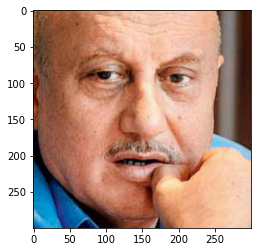

True BMI 24.8015873
Predicted BMI 3:  33.071934
Difference:  8.27034644633789
*************************************************************************



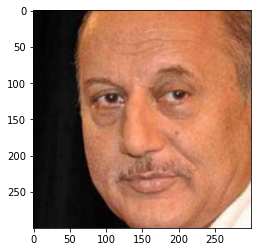

True BMI 24.8015873
Predicted BMI 3:  23.708378
Difference:  1.0932094618652357
*************************************************************************



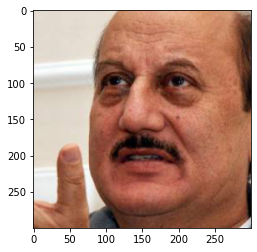

True BMI 24.8015873
Predicted BMI 3:  32.110573
Difference:  7.308985514941405
*************************************************************************



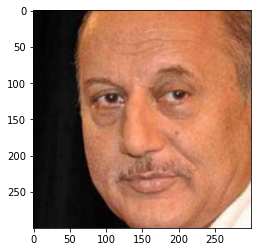

True BMI 24.8015873
Predicted BMI 3:  23.708378
Difference:  1.0932094618652357
*************************************************************************



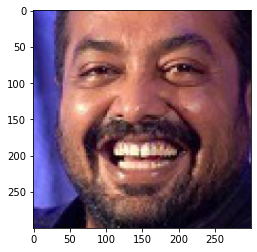

True BMI 26.51180407
Predicted BMI 3:  24.537247
Difference:  1.9745573658984377
*************************************************************************



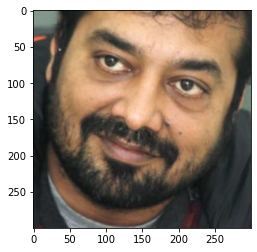

True BMI 26.51180407
Predicted BMI 3:  25.12188
Difference:  1.3899244923632814
*************************************************************************



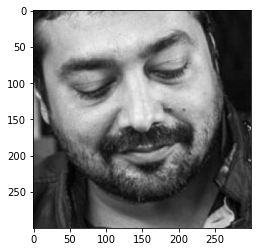

True BMI 26.51180407
Predicted BMI 3:  33.468136
Difference:  6.956331763740234
*************************************************************************



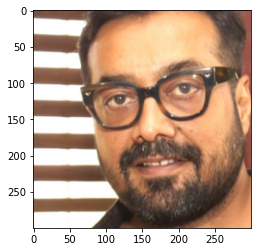

True BMI 26.51180407
Predicted BMI 3:  26.825907
Difference:  0.3141026835400389
*************************************************************************



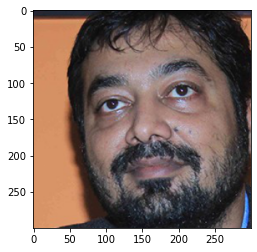

True BMI 26.51180407
Predicted BMI 3:  24.054783
Difference:  2.4570212025683595
*************************************************************************



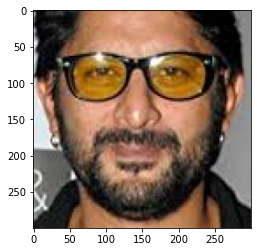

True BMI 24.8015873
Predicted BMI 3:  24.59359
Difference:  0.20799751728515758
*************************************************************************



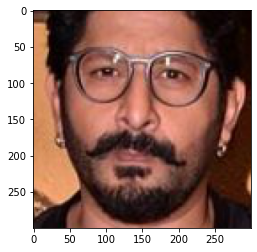

True BMI 24.8015873
Predicted BMI 3:  28.31085
Difference:  3.509262843432616
*************************************************************************



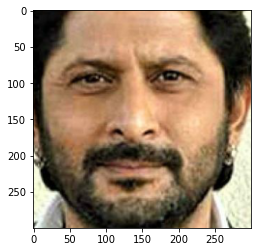

True BMI 24.8015873
Predicted BMI 3:  27.47973
Difference:  2.6781433060791002
*************************************************************************



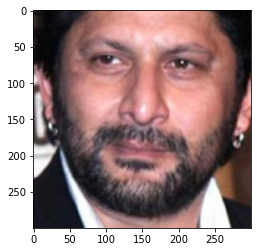

True BMI 24.8015873
Predicted BMI 3:  21.442831
Difference:  3.3587562605712904
*************************************************************************



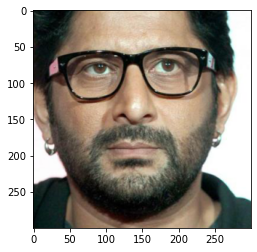

True BMI 24.8015873
Predicted BMI 3:  33.573338
Difference:  8.77175025493164
*************************************************************************



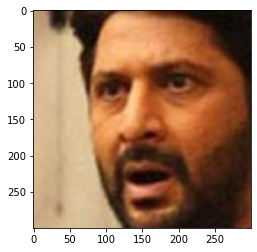

True BMI 24.8015873
Predicted BMI 3:  23.816746
Difference:  0.9848415419433607
*************************************************************************



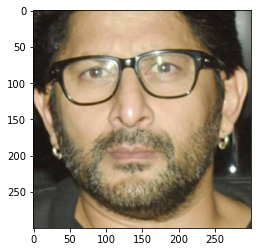

True BMI 24.8015873
Predicted BMI 3:  28.034891
Difference:  3.2333038285400377
*************************************************************************



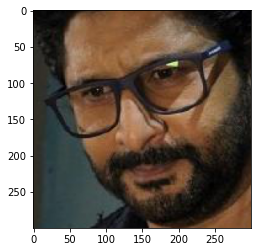

True BMI 24.8015873
Predicted BMI 3:  29.692795
Difference:  4.891207499804686
*************************************************************************



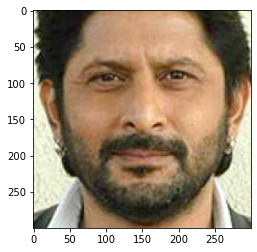

True BMI 24.8015873
Predicted BMI 3:  28.244503
Difference:  3.442915721240233
*************************************************************************



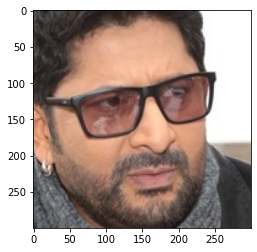

True BMI 24.8015873
Predicted BMI 3:  27.70916
Difference:  2.9075725510742174
*************************************************************************



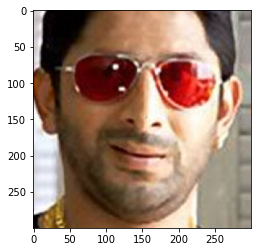

True BMI 24.8015873
Predicted BMI 3:  29.861622
Difference:  5.060034556689452
*************************************************************************



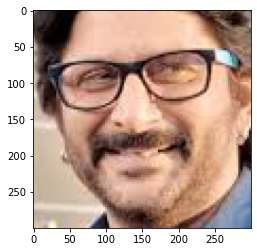

True BMI 24.8015873
Predicted BMI 3:  30.94034
Difference:  6.1387527421142565
*************************************************************************



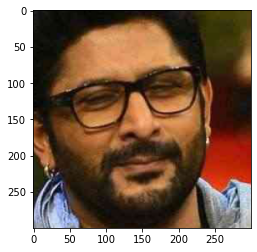

True BMI 24.8015873
Predicted BMI 3:  36.97263
Difference:  12.17104224711914
*************************************************************************



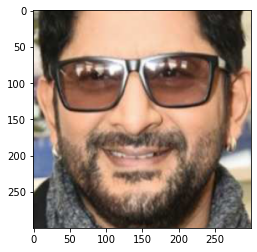

True BMI 24.8015873
Predicted BMI 3:  26.350857
Difference:  1.549269481005858
*************************************************************************



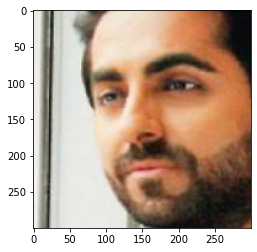

True BMI 25.51020408
Predicted BMI 3:  23.998222
Difference:  1.5119817289257824
*************************************************************************



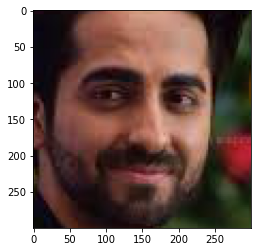

True BMI 25.51020408
Predicted BMI 3:  22.756298
Difference:  2.7539060148144543
*************************************************************************



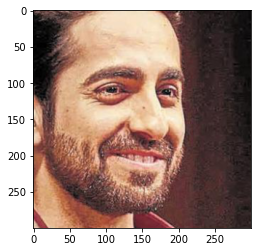

True BMI 25.51020408
Predicted BMI 3:  27.388504
Difference:  1.8782999483203113
*************************************************************************



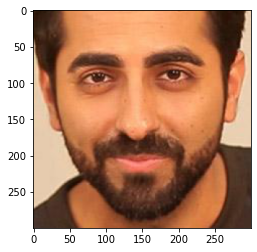

True BMI 25.51020408
Predicted BMI 3:  26.13908
Difference:  0.6288759676074207
*************************************************************************



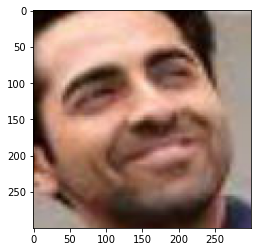

True BMI 25.51020408
Predicted BMI 3:  27.284378
Difference:  1.7741739717578113
*************************************************************************



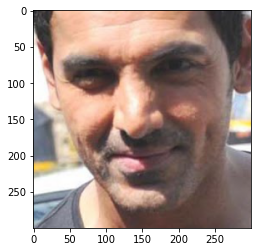

True BMI 28.37821519
Predicted BMI 3:  25.901165
Difference:  2.477050181455077
*************************************************************************



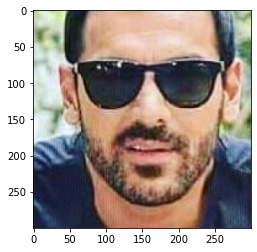

True BMI 28.37821519
Predicted BMI 3:  29.13452
Difference:  0.7563043870263684
*************************************************************************



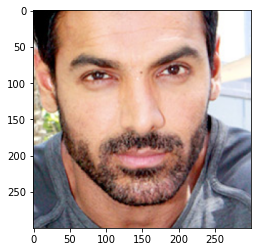

True BMI 28.37821519
Predicted BMI 3:  26.09176
Difference:  2.2864545546240223
*************************************************************************



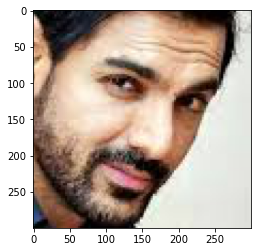

True BMI 28.37821519
Predicted BMI 3:  25.355375
Difference:  3.0228399000830066
*************************************************************************



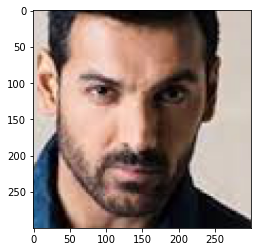

True BMI 28.37821519
Predicted BMI 3:  20.990105
Difference:  7.38811051470703
*************************************************************************



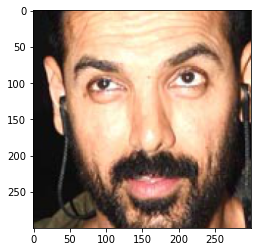

True BMI 28.37821519
Predicted BMI 3:  24.932259
Difference:  3.4459565840429676
*************************************************************************



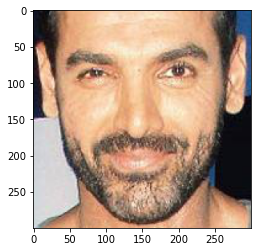

True BMI 28.37821519
Predicted BMI 3:  26.152365
Difference:  2.225850459165038
*************************************************************************



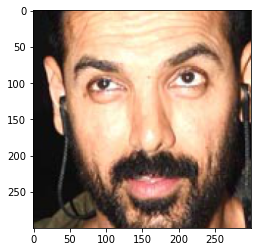

True BMI 28.37821519
Predicted BMI 3:  24.932259
Difference:  3.4459565840429676
*************************************************************************



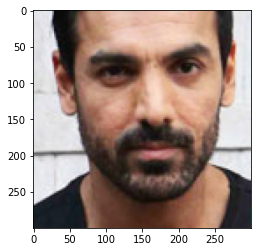

True BMI 28.37821519
Predicted BMI 3:  24.238935
Difference:  4.139279719418944
*************************************************************************



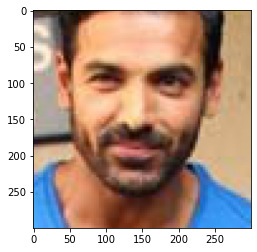

True BMI 28.37821519
Predicted BMI 3:  21.979588
Difference:  6.398627635068358
*************************************************************************



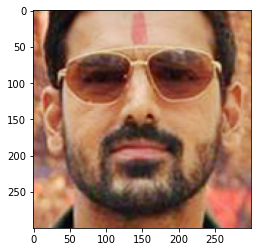

True BMI 28.37821519
Predicted BMI 3:  30.462496
Difference:  2.084280613833009
*************************************************************************



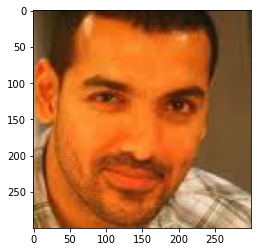

True BMI 28.37821519
Predicted BMI 3:  22.856972
Difference:  5.521243449277343
*************************************************************************



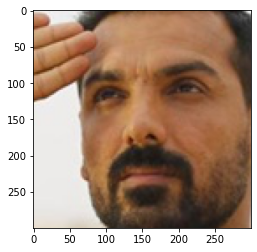

True BMI 28.37821519
Predicted BMI 3:  26.479736
Difference:  1.8984788618749988
*************************************************************************



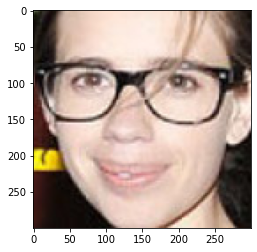

True BMI 18.33910035
Predicted BMI 3:  26.031223
Difference:  7.692122947119142
*************************************************************************



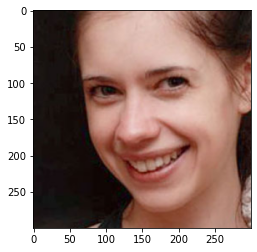

True BMI 18.33910035
Predicted BMI 3:  23.601383
Difference:  5.262282859228517
*************************************************************************



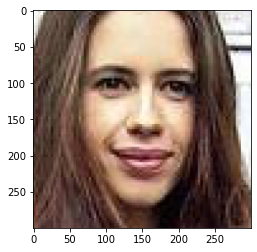

True BMI 18.33910035
Predicted BMI 3:  20.522505
Difference:  2.1834044565185557
*************************************************************************



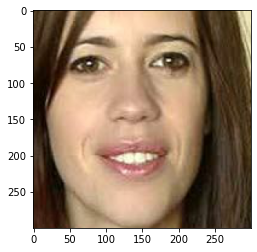

True BMI 18.33910035
Predicted BMI 3:  19.977316
Difference:  1.638215552709962
*************************************************************************



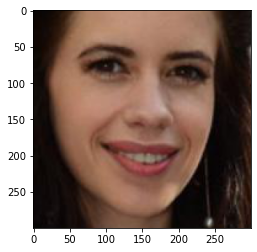

True BMI 18.33910035
Predicted BMI 3:  20.7346
Difference:  2.395499717138673
*************************************************************************



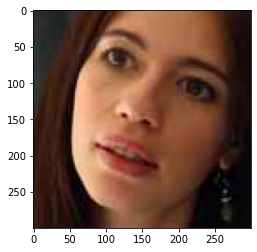

True BMI 18.33910035
Predicted BMI 3:  24.260145
Difference:  5.921044837377931
*************************************************************************



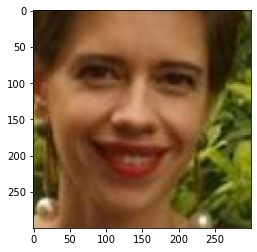

True BMI 18.33910035
Predicted BMI 3:  24.797834
Difference:  6.458734046362306
*************************************************************************



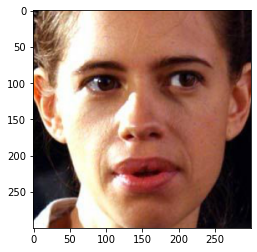

True BMI 18.33910035
Predicted BMI 3:  28.150063
Difference:  9.810962211035157
*************************************************************************



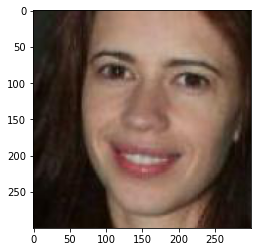

True BMI 18.33910035
Predicted BMI 3:  19.1321
Difference:  0.7929988016113292
*************************************************************************



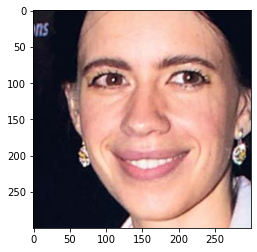

True BMI 18.33910035
Predicted BMI 3:  22.10748
Difference:  3.7683787454589854
*************************************************************************



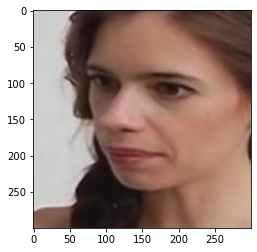

True BMI 18.33910035
Predicted BMI 3:  24.767996
Difference:  6.428895484350587
*************************************************************************



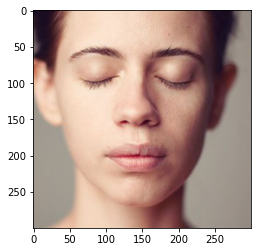

True BMI 18.33910035
Predicted BMI 3:  31.525875
Difference:  13.186774741552735
*************************************************************************



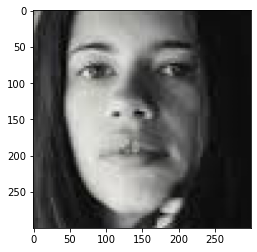

True BMI 18.33910035
Predicted BMI 3:  22.713453
Difference:  4.374352942846681
*************************************************************************



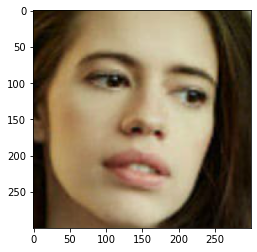

True BMI 18.33910035
Predicted BMI 3:  25.307827
Difference:  6.96872664584961
*************************************************************************



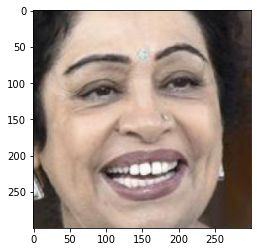

True BMI 24.97704316
Predicted BMI 3:  35.32803
Difference:  10.350986472568358
*************************************************************************



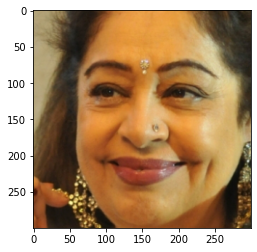

True BMI 24.97704316
Predicted BMI 3:  28.203861
Difference:  3.2268180765722647
*************************************************************************



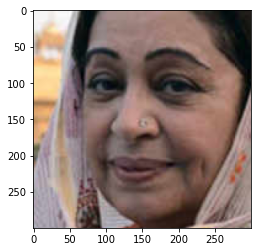

True BMI 24.97704316
Predicted BMI 3:  26.565031
Difference:  1.5879878916357413
*************************************************************************



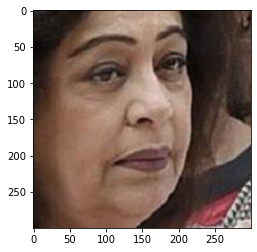

True BMI 24.97704316
Predicted BMI 3:  33.19805
Difference:  8.221008292636718
*************************************************************************



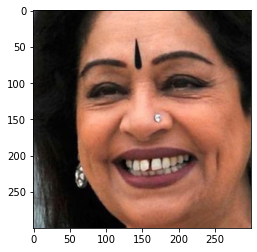

True BMI 24.97704316
Predicted BMI 3:  28.93224
Difference:  3.955196372470702
*************************************************************************



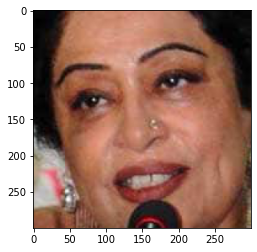

True BMI 24.97704316
Predicted BMI 3:  30.323109
Difference:  5.346065513095702
*************************************************************************



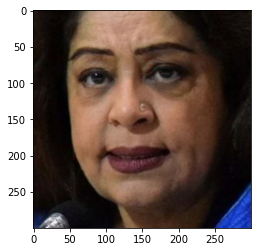

True BMI 24.97704316
Predicted BMI 3:  29.640604
Difference:  4.663560859165038
*************************************************************************



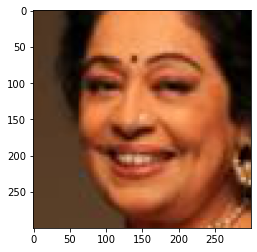

True BMI 24.97704316
Predicted BMI 3:  21.455687
Difference:  3.5213565907861337
*************************************************************************



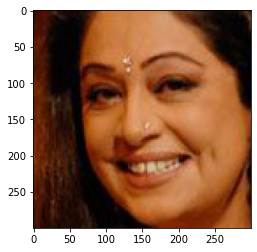

True BMI 24.97704316
Predicted BMI 3:  22.641108
Difference:  2.3359356007958993
*************************************************************************



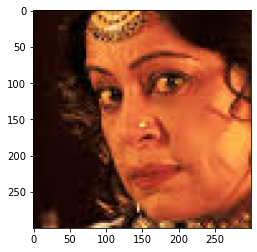

True BMI 24.97704316
Predicted BMI 3:  22.148438
Difference:  2.828605660000001
*************************************************************************



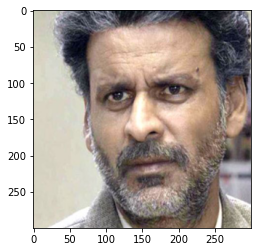

True BMI 22.20408163
Predicted BMI 3:  30.51108
Difference:  8.306998158208007
*************************************************************************



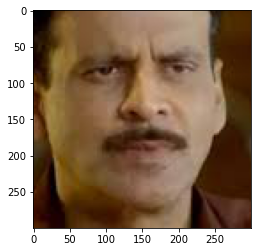

True BMI 22.20408163
Predicted BMI 3:  26.260336
Difference:  4.05625429224121
*************************************************************************



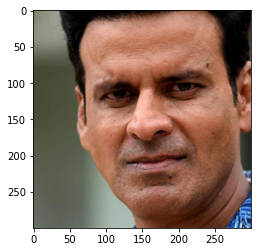

True BMI 22.20408163
Predicted BMI 3:  28.352358
Difference:  6.148276234379882
*************************************************************************



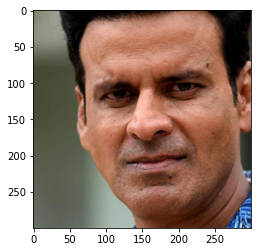

True BMI 22.20408163
Predicted BMI 3:  28.352358
Difference:  6.148276234379882
*************************************************************************



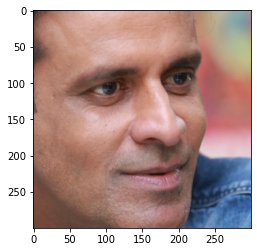

True BMI 22.20408163
Predicted BMI 3:  31.328966
Difference:  9.12488451074707
*************************************************************************



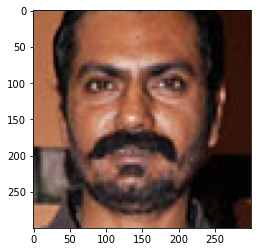

True BMI 21.2585034
Predicted BMI 3:  21.240484
Difference:  0.01801916232910017
*************************************************************************



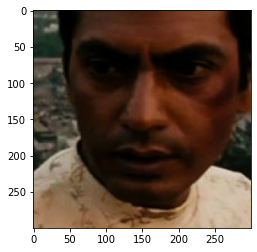

True BMI 21.2585034
Predicted BMI 3:  23.607468
Difference:  2.348964251367189
*************************************************************************



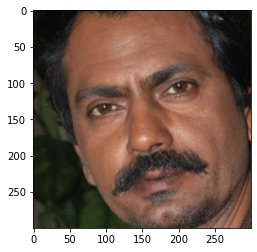

True BMI 21.2585034
Predicted BMI 3:  25.618093
Difference:  4.359590090600587
*************************************************************************



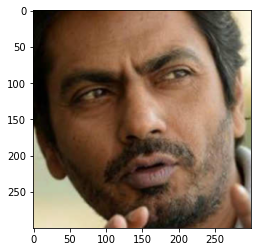

True BMI 21.2585034
Predicted BMI 3:  28.851978
Difference:  7.5934749020019545
*************************************************************************



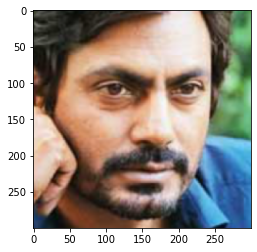

True BMI 21.2585034
Predicted BMI 3:  8.931894
Difference:  12.326609097631835
*************************************************************************



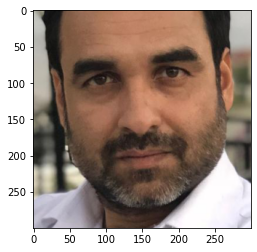

True BMI 22.85714286
Predicted BMI 3:  27.479761
Difference:  4.622618263657227
*************************************************************************



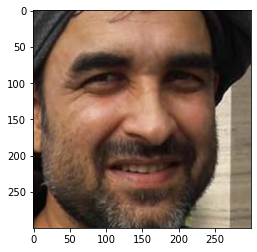

True BMI 22.85714286
Predicted BMI 3:  29.033354
Difference:  6.1762109455419925
*************************************************************************



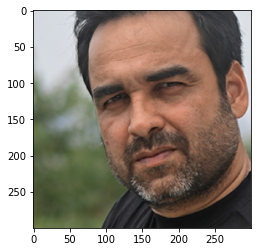

True BMI 22.85714286
Predicted BMI 3:  24.800934
Difference:  1.9437909778906253
*************************************************************************



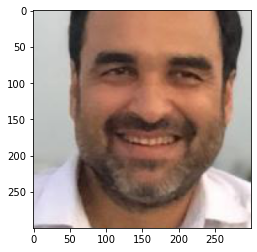

True BMI 22.85714286
Predicted BMI 3:  23.705683
Difference:  0.8485398945166018
*************************************************************************



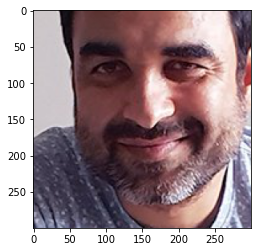

True BMI 22.85714286
Predicted BMI 3:  32.333885
Difference:  9.476742332871094
*************************************************************************



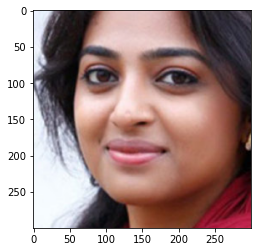

True BMI 21.484375
Predicted BMI 3:  31.593914
Difference:  10.109539031982422
*************************************************************************



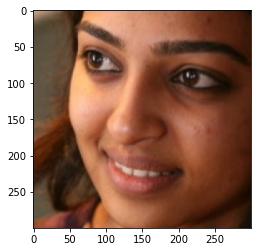

True BMI 21.484375
Predicted BMI 3:  25.859476
Difference:  4.375101089477539
*************************************************************************



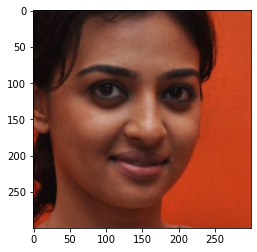

True BMI 21.484375
Predicted BMI 3:  27.889248
Difference:  6.404872894287109
*************************************************************************



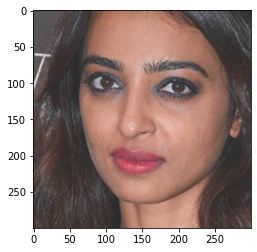

True BMI 21.484375
Predicted BMI 3:  22.845366
Difference:  1.3609905242919922
*************************************************************************



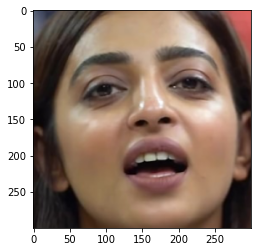

True BMI 21.484375
Predicted BMI 3:  34.731922
Difference:  13.247547149658203
*************************************************************************



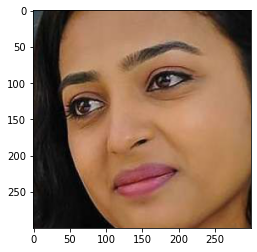

True BMI 21.484375
Predicted BMI 3:  35.403755
Difference:  13.919380187988281
*************************************************************************



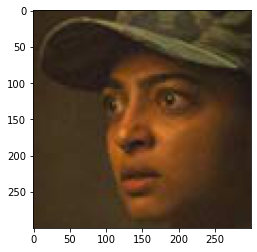

True BMI 21.484375
Predicted BMI 3:  19.692266
Difference:  1.7921085357666016
*************************************************************************



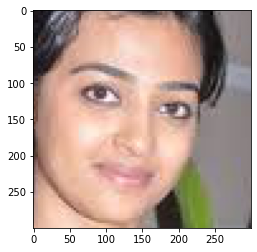

True BMI 21.484375
Predicted BMI 3:  19.579384
Difference:  1.9049911499023438
*************************************************************************



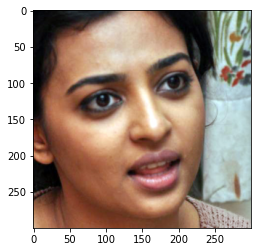

True BMI 21.484375
Predicted BMI 3:  32.80763
Difference:  11.323253631591797
*************************************************************************



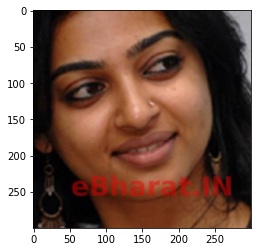

True BMI 21.484375
Predicted BMI 3:  33.18051
Difference:  11.696136474609375
*************************************************************************



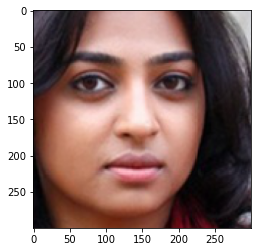

True BMI 21.484375
Predicted BMI 3:  29.973715
Difference:  8.489339828491211
*************************************************************************



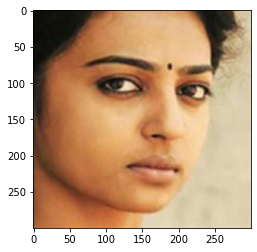

True BMI 21.484375
Predicted BMI 3:  33.005886
Difference:  11.52151107788086
*************************************************************************



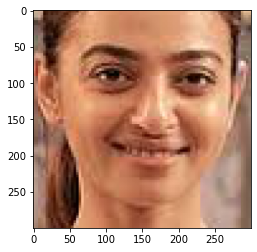

True BMI 21.484375
Predicted BMI 3:  20.55073
Difference:  0.9336452484130859
*************************************************************************



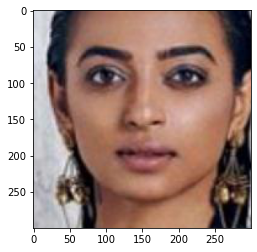

True BMI 21.484375
Predicted BMI 3:  26.127287
Difference:  4.642911911010742
*************************************************************************



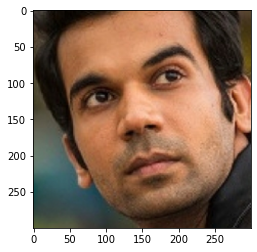

True BMI 24.91349481
Predicted BMI 3:  28.85459
Difference:  3.941094652280274
*************************************************************************



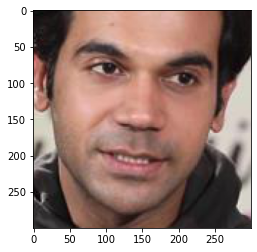

True BMI 24.91349481
Predicted BMI 3:  23.712137
Difference:  1.2013575877099605
*************************************************************************



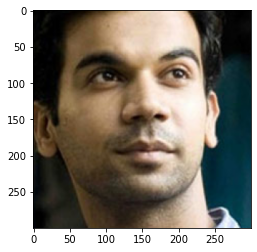

True BMI 24.91349481
Predicted BMI 3:  32.989674
Difference:  8.076178804501954
*************************************************************************



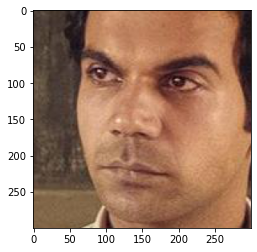

True BMI 24.91349481
Predicted BMI 3:  24.92966
Difference:  0.01616598711914108
*************************************************************************



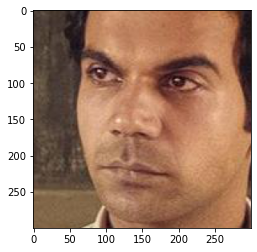

True BMI 24.91349481
Predicted BMI 3:  24.92966
Difference:  0.01616598711914108
*************************************************************************



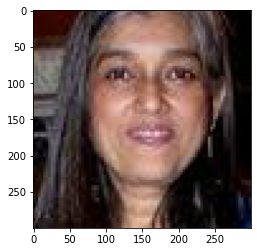

True BMI 20.70081674
Predicted BMI 3:  20.079594
Difference:  0.6212230815527349
*************************************************************************



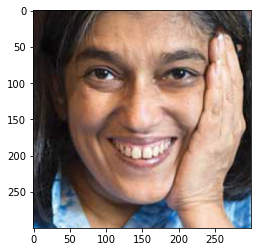

True BMI 20.70081674
Predicted BMI 3:  26.977015
Difference:  6.276197801625976
*************************************************************************



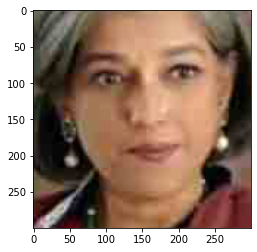

True BMI 20.70081674
Predicted BMI 3:  25.446144
Difference:  4.745327364003906
*************************************************************************



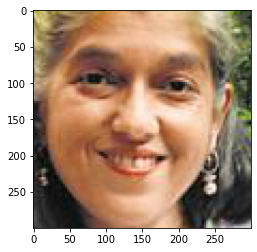

True BMI 20.70081674
Predicted BMI 3:  27.5412
Difference:  6.840383897817382
*************************************************************************



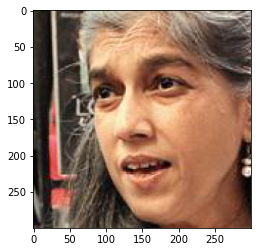

True BMI 20.70081674
Predicted BMI 3:  24.5061
Difference:  3.805282960927734
*************************************************************************



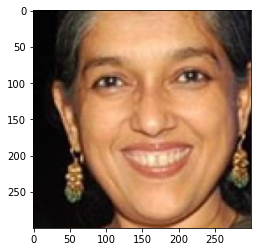

True BMI 20.70081674
Predicted BMI 3:  27.010584
Difference:  6.309767137563476
*************************************************************************



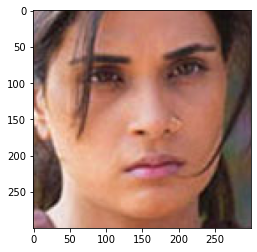

True BMI 20.93663912
Predicted BMI 3:  23.25787
Difference:  2.3212306004589855
*************************************************************************



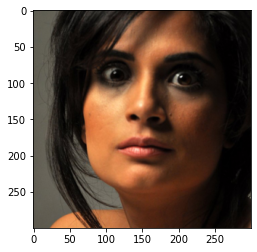

True BMI 20.93663912
Predicted BMI 3:  29.788908
Difference:  8.852268884760743
*************************************************************************



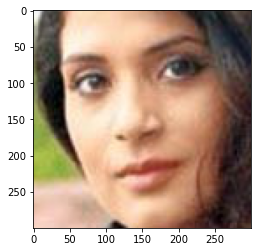

True BMI 20.93663912
Predicted BMI 3:  26.943804
Difference:  6.0071646672314465
*************************************************************************



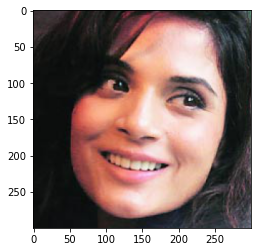

True BMI 20.93663912
Predicted BMI 3:  28.224293
Difference:  7.287653635126954
*************************************************************************



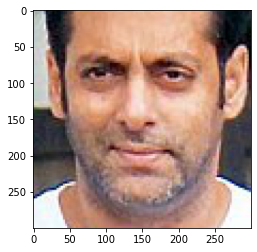

True BMI 24.77209671
Predicted BMI 3:  27.55263
Difference:  2.7805327608251957
*************************************************************************



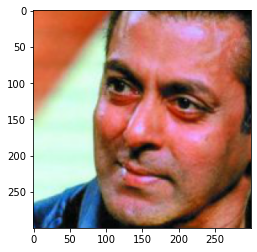

True BMI 24.77209671
Predicted BMI 3:  32.903336
Difference:  8.131238861289063
*************************************************************************



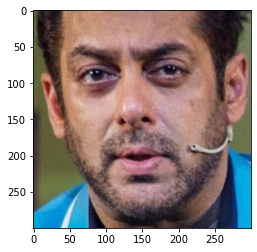

True BMI 24.77209671
Predicted BMI 3:  29.582556
Difference:  4.810459060874024
*************************************************************************



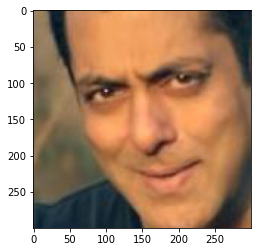

True BMI 24.77209671
Predicted BMI 3:  26.241047
Difference:  1.4689501955175785
*************************************************************************



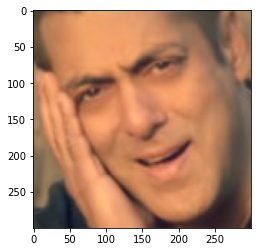

True BMI 24.77209671
Predicted BMI 3:  27.31512
Difference:  2.543023987021485
*************************************************************************



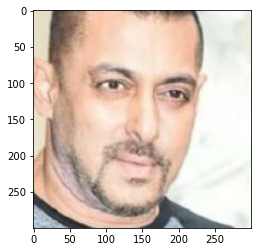

True BMI 24.77209671
Predicted BMI 3:  24.917643
Difference:  0.1455458833837895
*************************************************************************



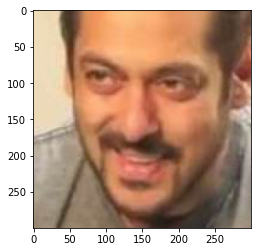

True BMI 24.77209671
Predicted BMI 3:  19.605272
Difference:  5.166824416909179
*************************************************************************



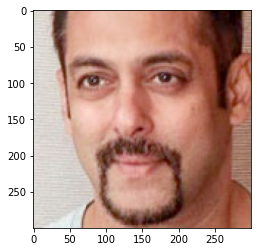

True BMI 24.77209671
Predicted BMI 3:  29.30459
Difference:  4.532493515219727
*************************************************************************



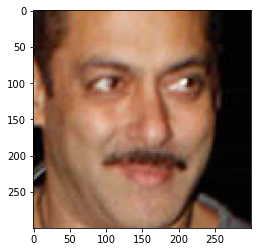

True BMI 24.77209671
Predicted BMI 3:  24.817894
Difference:  0.045797271933594175
*************************************************************************



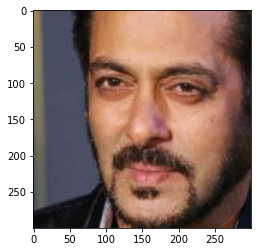

True BMI 24.77209671
Predicted BMI 3:  25.709541
Difference:  0.9374446108007817
*************************************************************************



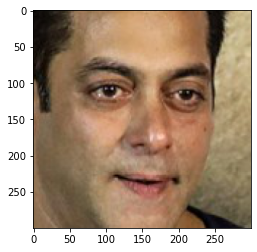

True BMI 24.77209671
Predicted BMI 3:  29.931026
Difference:  5.158929748740235
*************************************************************************



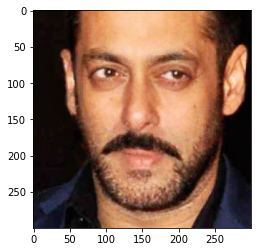

True BMI 24.77209671
Predicted BMI 3:  24.539112
Difference:  0.23298461893554645
*************************************************************************



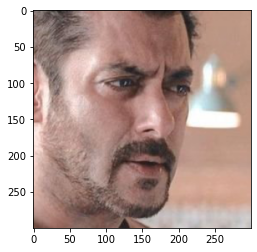

True BMI 24.77209671
Predicted BMI 3:  29.64229
Difference:  4.870193405356446
*************************************************************************



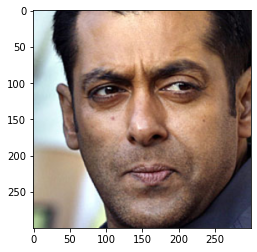

True BMI 24.77209671
Predicted BMI 3:  37.763817
Difference:  12.991720123496094
*************************************************************************



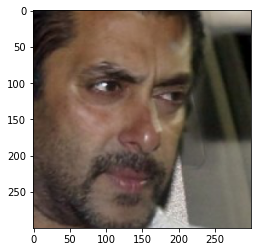

True BMI 24.77209671
Predicted BMI 3:  22.963497
Difference:  1.8085995481347652
*************************************************************************



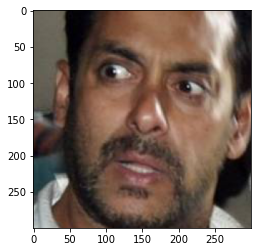

True BMI 24.77209671
Predicted BMI 3:  25.448605
Difference:  0.6765078737402348
*************************************************************************



error: OpenCV(4.5.1) /private/var/folders/nz/vv4_9tw56nv9k3tkvyszvwg80000gn/T/pip-req-build-39p1qqfs/opencv/modules/imgproc/src/resize.cpp:4051: error: (-215:Assertion failed) !ssize.empty() in function 'resize'


In [13]:
true_bmi=[]
predicted_bmi1=[]
predicted_bmi2=[]
predicted_bmi3=[]
predicted_bmi4=[]

for ii,path in enumerate(all_paths_val[:]):
    image_path=str(path)
    img = cv2.imread(image_path)
    data = image.imread(image_path)
    new_image=preprocess_image(img,data,image_path=None)
    
    if isinstance(new_image,np.ndarray):
        new_image=np.expand_dims(new_image,axis=0)
        #plt.imshow(data)
        #plt.show()
        plt.imshow(new_image[0,:,:,:])
        plt.show()
        bmi_predict=loaded_model1.predict(new_image/255.0)
        bmi_predict2=loaded_model2.predict(new_image/255.0)
        bmi_predict3=loaded_model3.predict(new_image/255.0)
        bmi_predict4=loaded_model4.predict(new_image/255.0)


        print('True BMI', all_bmi_val.iloc[ii])
#         print('Predicted BMI 1: ',bmi_predict[0][0])
#         print('Predicted BMI 2: ',bmi_predict2[0][0])
        print('Predicted BMI 3: ',bmi_predict3[0][0])
#         print('Predicted BMI 4: ',bmi_predict4[0][0])
        print('Difference: ',np.abs(all_bmi_val.iloc[ii]-bmi_predict3[0][0]))
        print('*************************************************************************\n')
        true_bmi.append(all_bmi_val.iloc[ii])
        predicted_bmi1.append(bmi_predict[0][0])
        predicted_bmi2.append(bmi_predict2[0][0])
        predicted_bmi3.append(bmi_predict3[0][0])
        predicted_bmi4.append(bmi_predict4[0][0])



Text(0, 0.5, 'BMI')

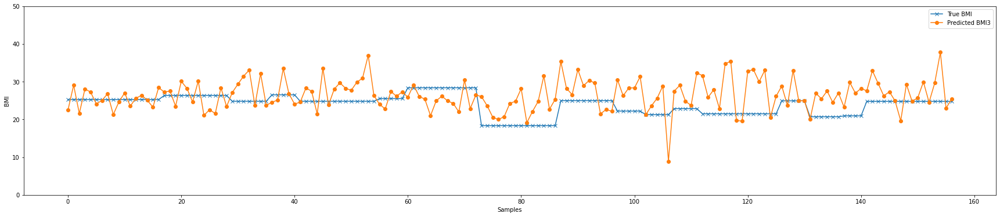

In [14]:
plt.figure(figsize=(30,6))
plt.plot(true_bmi,'x-',label='True BMI')
# plt.plot(predicted_bmi1,'o-',label='Predicted BMI1')
# plt.plot(predicted_bmi2,'o-',label='Predicted BMI2')
plt.plot(predicted_bmi3,'o-',label='Predicted BMI3')
#plt.plot(predicted_bmi4,'o-',label='Predicted BMI4')
plt.ylim(0,50)
plt.legend()

plt.xlabel('Samples')
plt.ylabel('BMI')

In [15]:
truenp=np.array(true_bmi)
predictnp=np.array(predicted_bmi3)

Text(0, 0.5, 'BMI')

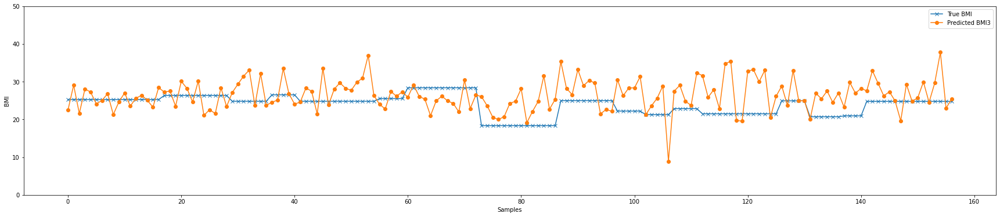

In [16]:
plt.figure(figsize=(30,6))
plt.plot(truenp[truenp<35],'x-',label='True BMI')
# plt.plot(predicted_bmi1,'o-',label='Predicted BMI1')
# plt.plot(predicted_bmi2,'o-',label='Predicted BMI2')
plt.plot(predictnp[truenp<35],'o-',label='Predicted BMI3')
#plt.plot(predicted_bmi4,'o-',label='Predicted BMI4')
plt.ylim(0,50)
plt.legend()
plt.xlabel('Samples')
plt.ylabel('BMI')

Text(0, 0.5, 'BMI')

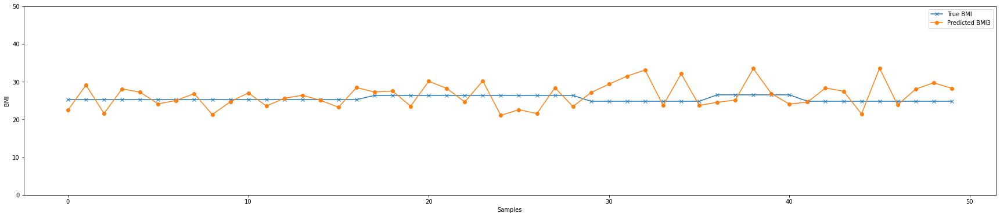

In [17]:
plt.figure(figsize=(30,6))
plt.plot(true_bmi[:50],'x-',label='True BMI')
# plt.plot(predicted_bmi1,'o-',label='Predicted BMI1')
# plt.plot(predicted_bmi2,'o-',label='Predicted BMI2')
plt.plot(predicted_bmi3[:50],'o-',label='Predicted BMI3')
#plt.plot(predicted_bmi4,'o-',label='Predicted BMI4')
plt.ylim(0,50)
plt.legend()
plt.xlabel('Samples')
plt.ylabel('BMI')

Text(0, 0.5, 'BMI')

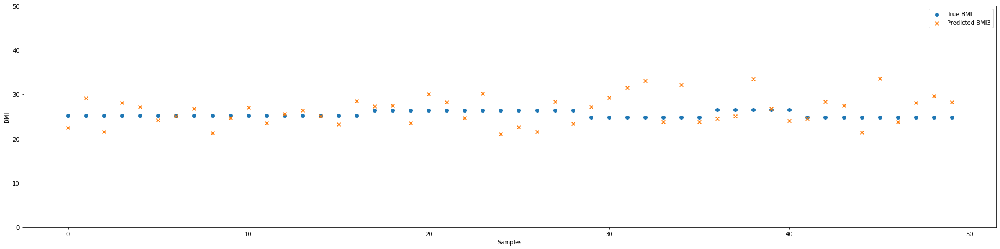

In [18]:
plt.figure(figsize=(30,7))
plt.scatter(np.arange(0,50,1),true_bmi[:50],label='True BMI')
# plt.plot(predicted_bmi1,'o-',label='Predicted BMI1')
# plt.plot(predicted_bmi2,'o-',label='Predicted BMI2')
plt.scatter(np.arange(0,50,1),predicted_bmi3[:50],label='Predicted BMI3',marker='x')
#plt.plot(predicted_bmi4,'o-',label='Predicted BMI4')
plt.legend()
plt.ylim(0,50)
plt.xlabel('Samples')
plt.ylabel('BMI')

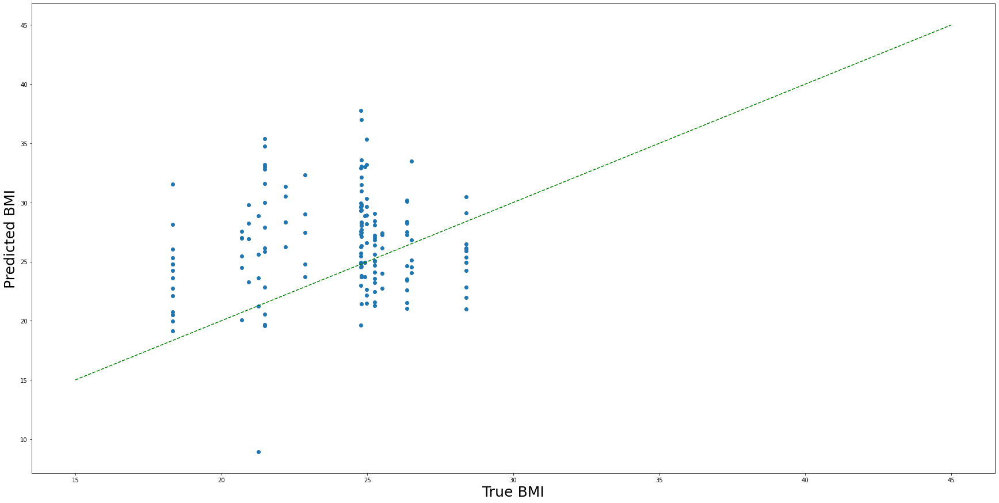

In [24]:
plt.figure(figsize=(30,15))
#plt.scatter(true_bmi,predicted_bmi3)
#plt.plot(true_bmi,predicted_bmi3, 'o')
plt.xlabel('True BMI', fontsize=25)
plt.ylabel('Predicted BMI', fontsize=25)


#create basic scatterplot
plt.plot(true_bmi,predicted_bmi3, 'o')

#obtain m (slope) and b(intercept) of linear regression line
#m, b = np.polyfit(true_bmi,predicted_bmi3, '1')

#add linear regression line to scatterplot 
#plt.plot(true_bmi, m*true_bmi+b)
plt.plot([15,45],[15,45],'g--')

In [19]:
## Mean Absolute Error Model 1
np.abs(np.array(true_bmi) - np.array(predicted_bmi1)).mean()

10.178601693435757

In [20]:
## Mean Absolute Error Model 2
np.abs(np.array(true_bmi) - np.array(predicted_bmi2)).mean()

4.684987449528746

In [21]:
## Mean Absolute Error Model 3
np.abs(np.array(true_bmi) - np.array(predicted_bmi3)).mean()

4.175389533742785

In [22]:
## Mean Absolute Error Model 4
np.abs(np.array(true_bmi) - np.array(predicted_bmi4)).mean()

2.847811147005623

### Histograms for BMI

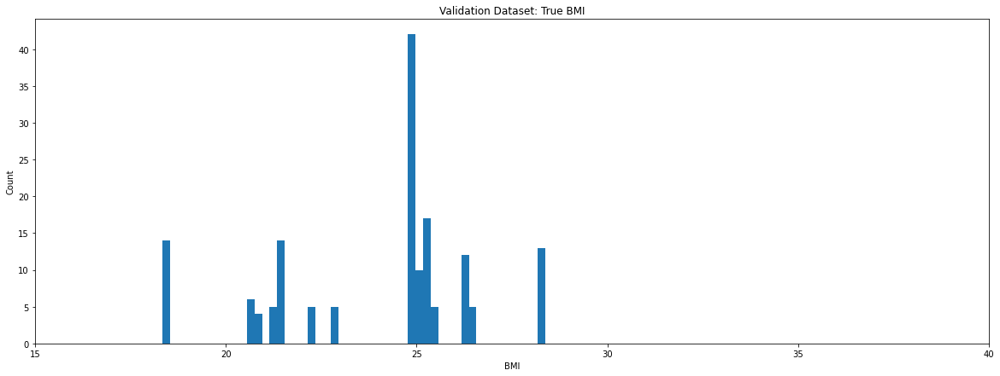

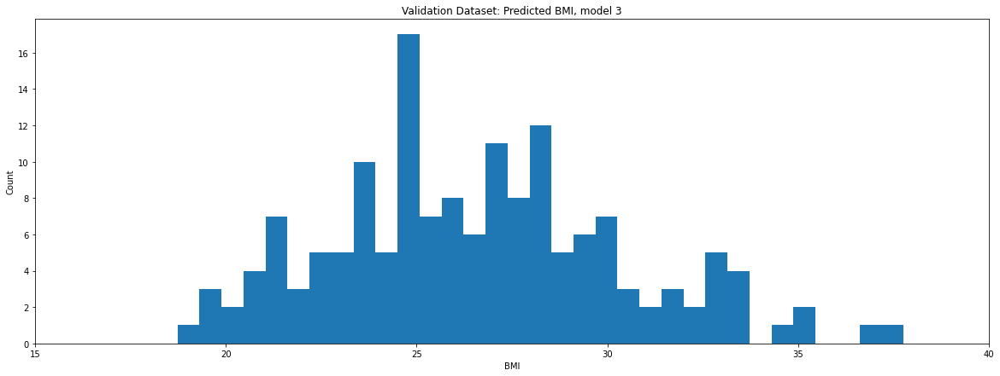

In [23]:
plt.figure(figsize=(20,7))
plt.hist(true_bmi,bins=50)
plt.xlim(15,40)
plt.xlabel('BMI')
plt.ylabel('Count')
plt.title('Validation Dataset: True BMI')
plt.show()




plt.figure(figsize=(20,7))
plt.hist(predicted_bmi3,bins=50)
plt.xlim(15,40)
plt.xlabel('BMI')
plt.ylabel('Count')
plt.title('Validation Dataset: Predicted BMI, model 3')
plt.show()

